# Analysis of the COVID-19 data and comparison with the  2020 World Happiness Report

By Nikodem Janarek

The data on COVID-19 used was made avaliable through John Hopkins University: https://data.humdata.org/dataset/novel-coronavirus-2019-ncov-cases.
The World Happiness Report 2020 data from: https://www.kaggle.com/londeen/world-happiness-report-2020.

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
import plotly.plotly as py 
import plotly.graph_objs as go #importing graphical objects
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.offline as pyo
import seaborn as sns

## Extract and visualise the COVID-19 data

In [2]:
confirmed_cases = pd.read_csv('time_series_covid19_confirmed_global.csv')
recovered_cases = pd.read_csv('time_series_covid19_recovered_global.csv')
deaths = pd.read_csv('time_series_covid19_deaths_global.csv')

In [3]:
#group data per country
confirmed_per_country = confirmed_cases.groupby('Country/Region').sum()
recovered_per_country = recovered_cases.groupby('Country/Region').sum()
deaths_per_country = deaths.groupby('Country/Region').sum()

In [4]:
confirmed_per_country.drop(['Lat', 'Long'], axis = 1, inplace = True)
recovered_per_country.drop(['Lat', 'Long'], axis = 1, inplace = True)
deaths_per_country.drop(['Lat', 'Long'], axis = 1, inplace = True)

In [5]:
confirmed_per_country.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,35301,35475,35526,35615,35727,35928,35981,36036,36157,36263
Albania,0,0,0,0,0,0,0,0,0,0,...,4008,4090,4171,4290,4358,4466,4570,4637,4763,4880
Algeria,0,0,0,0,0,0,0,0,0,0,...,22549,23084,23691,24278,24872,25484,26159,26764,27357,27973
Andorra,0,0,0,0,0,0,0,0,0,0,...,880,880,884,884,889,889,897,897,897,907
Angola,0,0,0,0,0,0,0,0,0,0,...,687,705,749,779,812,851,880,916,932,950


In [6]:
recovered_per_country.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,23273,23634,23741,23741,23924,24550,24602,24793,25180,25198
Albania,0,0,0,0,0,0,0,0,0,0,...,2264,2311,2352,2397,2463,2523,2608,2637,2682,2745
Algeria,0,0,0,0,0,0,0,0,0,0,...,15744,16051,16400,16646,16983,17369,17369,18076,18088,18837
Andorra,0,0,0,0,0,0,0,0,0,0,...,803,803,803,803,803,803,803,803,803,803
Angola,0,0,0,0,0,0,0,0,0,0,...,210,221,221,221,221,236,241,242,242,242


In [7]:
deaths_per_country.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,1164,1181,1185,1186,1190,1211,1225,1248,1259,1269
Albania,0,0,0,0,0,0,0,0,0,0,...,111,112,113,117,120,123,128,134,138,144
Algeria,0,0,0,0,0,0,0,0,0,0,...,1068,1078,1087,1100,1111,1124,1136,1146,1155,1163
Andorra,0,0,0,0,0,0,0,0,0,0,...,52,52,52,52,52,52,52,52,52,52
Angola,0,0,0,0,0,0,0,0,0,0,...,29,29,29,30,33,33,35,39,40,41


In [8]:
#all the data per country up to the 27th of July 2020:
cpc = pd.DataFrame(data = confirmed_per_country.iloc[:,-1:])
rpc = pd.DataFrame(data = recovered_per_country.iloc[:,-1:])
dpc = pd.DataFrame(data = deaths_per_country.iloc[:,-1:])
covid_data = pd.concat([cpc, rpc, dpc], axis=1)
covid_data.columns = ['confirmed', 'recovered', 'deaths']
covid_data.head()

,confirmed,recovered,deaths
Country/Region,,,
Afghanistan,36263,25198,1269
Albania,4880,2745,144
Algeria,27973,18837,1163
Andorra,907,803,52
Angola,950,242,41


In [9]:
def plotWorld (data_i, title):
    '''
    Plot world choropleth maps
    '''
   
    #Set notebook mode to work in offline
    pyo.init_notebook_mode()

    data = dict(type = 'choropleth',
                locations = pd.DataFrame(data=covid_data.index)['Country/Region'],
                locationmode = 'country names',
                z = data_i,
                text = pd.DataFrame(data=covid_data.index)['Country/Region'],
                colorscale= 'Portland',
                reversescale = False,
                marker = dict(line = dict(color='white',width=1)),
                colorbar = {'title':'members'}
               )
    layout = dict(title = title,
                 geo = dict(showframe = False,
                           projection = {'type':"miller"})
                 )
    choromap = go.Figure(data=[data],layout=layout)

    iplot(choromap)
    
plotWorld(covid_data['confirmed'], 'Total confirmed covid19 cases')
plotWorld(covid_data['recovered'], 'Total recovered covid19 cases')
plotWorld(covid_data['deaths'], 'Total deaths covid19 cases')

### Additional analysis for 10 countries with most cases

In [10]:
# new dataframe
plot_df_cases = confirmed_per_country.sort_values(by = ['7/27/20'], ascending = False).head(10)
plot_df_cases.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
US,1,1,2,2,5,5,5,5,5,7,...,3711413,3773260,3834677,3899211,3970121,4038816,4112531,4178970,4233923,4290259
Brazil,0,0,0,0,0,0,0,0,0,0,...,2074860,2098389,2118646,2159654,2227514,2287475,2343366,2394513,2419091,2442375
India,0,0,0,0,0,0,0,0,1,1,...,1077781,1118206,1155338,1193078,1238798,1288108,1337024,1385635,1435616,1480073
Russia,0,0,0,0,0,0,0,0,0,2,...,764215,770311,776212,782040,787890,793720,799499,805332,811073,816680
South Africa,0,0,0,0,0,0,0,0,0,0,...,350879,364328,373628,381798,394948,408052,421996,434200,445433,452529


<IPython.core.display.Javascript object>


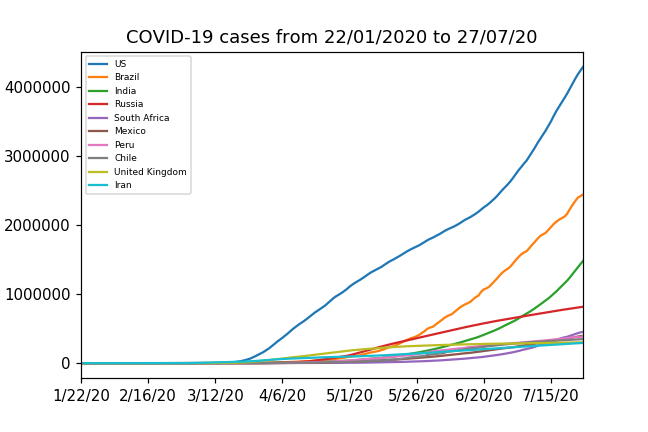

In [23]:
for i in plot_df_cases.index:
    plot_df_cases.loc[i].plot()
    plt.legend(loc = 'best', prop={'size': 6})
    plt.title('COVID-19 cases from 22/01/2020 to 27/07/20');

#### Maximum infection rate

In [14]:
countries = list(confirmed_per_country.index)
max_infection_rates = []
for i in countries:
    max_infection_rates.append(confirmed_per_country.loc[i].diff().max())
confirmed_per_country['max_infection_rates'] = max_infection_rates

confirmed_per_country.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,max_infection_rates
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,35475,35526,35615,35727,35928,35981,36036,36157,36263,915.0
Albania,0,0,0,0,0,0,0,0,0,0,...,4090,4171,4290,4358,4466,4570,4637,4763,4880,126.0
Algeria,0,0,0,0,0,0,0,0,0,0,...,23084,23691,24278,24872,25484,26159,26764,27357,27973,675.0
Andorra,0,0,0,0,0,0,0,0,0,0,...,880,884,884,889,889,897,897,897,907,79.0
Angola,0,0,0,0,0,0,0,0,0,0,...,705,749,779,812,851,880,916,932,950,62.0


In [15]:
infection_rate_df = pd.DataFrame(confirmed_per_country['max_infection_rates']).sort_values(by = ['max_infection_rates'], ascending = False)
infection_rate_df.head()

,max_infection_rates
Country/Region,
US,77255.0
Brazil,67860.0
India,49981.0
France,26849.0
Kazakhstan,18757.0


<IPython.core.display.Javascript object>


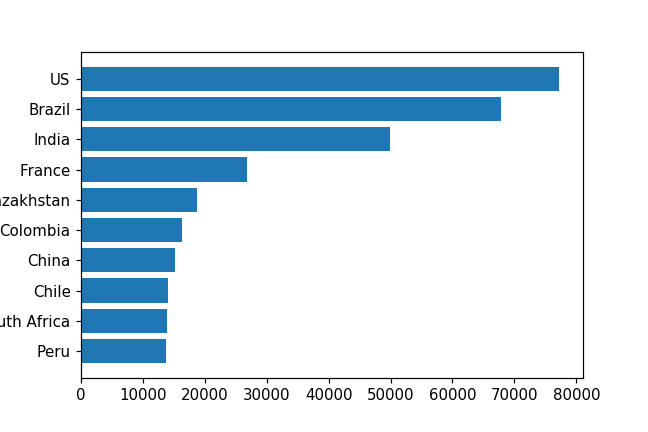

In [52]:
plt.figure()
y = infection_rate_df.head(10)['max_infection_rates'][::-1]
x = infection_rate_df.head(10).index[::-1]
plt.barh(x,y);

## 2020 World Happiness Report data

In [126]:
whr_df = pd.read_csv('datasets_569763_1033439_WHR20_DataForFigure2.1.csv')
whr_df.head(10)

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.8087,0.031156,7.869766,7.747634,10.639267,0.954330,71.900825,0.949172,-0.059482,0.195445,1.972317,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835
1,Denmark,Western Europe,7.6456,0.033492,7.711245,7.579955,10.774001,0.955991,72.402504,0.951444,0.066202,0.168489,1.972317,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741
2,Switzerland,Western Europe,7.5599,0.035014,7.628528,7.491272,10.979933,0.942847,74.102448,0.921337,0.105911,0.303728,1.972317,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267
3,Iceland,Western Europe,7.5045,0.059616,7.621347,7.387653,10.772559,0.974670,73.000000,0.948892,0.246944,0.711710,1.972317,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688
4,Norway,Western Europe,7.4880,0.034837,7.556281,7.419719,11.087804,0.952487,73.200783,0.955750,0.134533,0.263218,1.972317,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266
5,Netherlands,Western Europe,7.4489,0.027792,7.503372,7.394428,10.812712,0.939139,72.300919,0.908548,0.207612,0.364717,1.972317,1.338946,1.463646,0.975675,0.613626,0.336318,0.368570,2.352117
6,Sweden,Western Europe,7.3535,0.036234,7.424519,7.282481,10.758794,0.926311,72.600769,0.939144,0.111615,0.250880,1.972317,1.322235,1.433348,0.986470,0.650298,0.272828,0.442066,2.246299
7,New Zealand,North America and ANZ,7.2996,0.039465,7.376953,7.222248,10.500943,0.949119,73.202629,0.936217,0.191598,0.221139,1.972317,1.242318,1.487218,1.008138,0.646790,0.325726,0.461268,2.128108
8,Austria,Western Europe,7.2942,0.033365,7.359596,7.228804,10.742824,0.928046,73.002502,0.899989,0.085429,0.499955,1.972317,1.317286,1.437445,1.000934,0.603369,0.255510,0.281256,2.398446
9,Luxembourg,Western Europe,7.2375,0.030852,7.297970,7.177031,11.450681,0.906912,72.599998,0.905636,-0.004621,0.367084,1.972317,1.536676,1.387528,0.986443,0.610137,0.195954,0.367041,2.153700


<IPython.core.display.Javascript object>


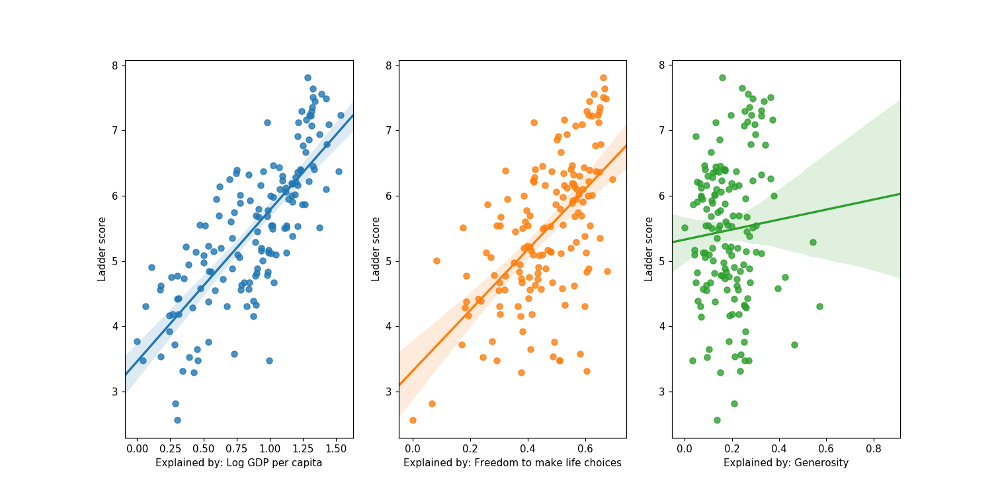

In [221]:
%matplotlib notebook
fig, subaxes = plt.subplots(1, 3, figsize=(14,7))
x1 = (whr_df['Explained by: Log GDP per capita'],  whr_df['Explained by: Freedom to make life choices'],
      whr_df['Explained by: Generosity'])
print(subaxes)
n = (0,1, 2)
for x, ax, i in zip(x1, subaxes, n):
    y = whr_df['Ladder score']
    sns.regplot(x, y, ax = subaxes[i])
    
#plt.tight_layout()

Thus, as it can be observed, the GDP, which can be related to the economic potential, and thus the development of the country is higly related with the hapiness index. Same can be said for the freedom to make life choices as a metric, although the relation is less sharp.

As for the generosity metric, it doesn't seem to have a clear effect.

## COVID-19 against World Happiness Report data

In [217]:
columns = (whr_df['Country name'], whr_df['Explained by: Log GDP per capita'], 
           whr_df['Explained by: Healthy life expectancy'], whr_df['Explained by: Freedom to make life choices'])
whr_df2 = pd.DataFrame(data=columns).T
whr_df2.head()

,Country name,Explained by: Log GDP per capita,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices
0,Finland,1.28519,0.961271,0.662317
1,Denmark,1.32695,0.979333,0.66504
2,Switzerland,1.39077,1.04053,0.628954
3,Iceland,1.3265,1.00084,0.661981
4,Norway,1.42421,1.00807,0.670201


In [218]:
whr_df2.set_index('Country name', inplace = True)

In [219]:
dfVS = whr_df2.join(infection_rate_df, how = 'inner')
dfVS.head()

,Explained by: Log GDP per capita,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,max_infection_rates
Finland,1.28519,0.961271,0.662317,267.0
Denmark,1.32695,0.979333,0.66504,391.0
Switzerland,1.39077,1.04053,0.628954,1321.0
Iceland,1.3265,1.00084,0.661981,99.0
Norway,1.42421,1.00807,0.670201,386.0


<IPython.core.display.Javascript object>


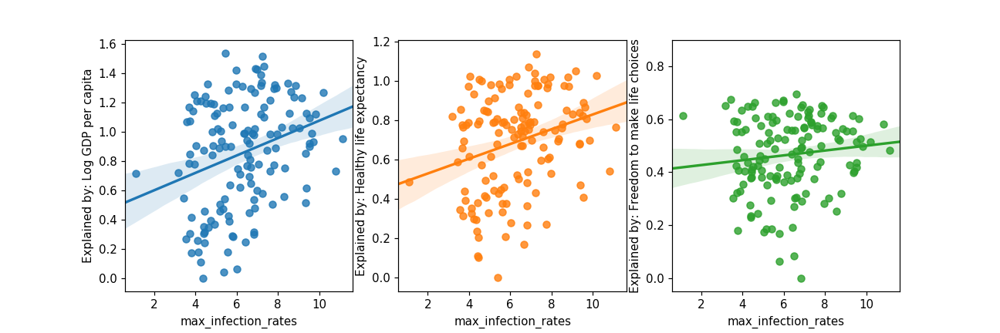

In [220]:
%matplotlib notebook
fig, subaxes = plt.subplots(1, 3, figsize=(12,4))

y1 = (dfVS['Explained by: Log GDP per capita'], dfVS['Explained by: Healthy life expectancy'],
      dfVS['Explained by: Freedom to make life choices'])
n = (0,1,2)
for ax, i, y in zip(subaxes, n, y1):
    x = np.log(dfVS['max_infection_rates'][0:141])
#print(len(x),len(y))
    sns.regplot(x, y, ax = subaxes[i])

At first sight it can be said that developed countries have higher infection rates. This can be due to the fact that those countries are more globalised making it easier for the virus to spread. Neverltheless, there exists a posibility that poorer countires do not have the capability to trace and detect all the cases and deaths of the virus, making this data questionable.